# Supporting forest

In [1]:
import numpy as np
import openpyxl
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import sklearn
from sklearn.model_selection import GridSearchCV
import joblib

xls = pd.ExcelFile('sep_dataset.xlsx')

datasets_tr = {}

for dataset_name in xls.sheet_names:
    datasets_tr[dataset_name] = pd.read_excel(xls, dataset_name)

X_cols = ['Cement (%W)', 'Water (%W)', 'Fine Agg (%W)', 'PCMs (%W)',
          'Fly ash (%W)', 'Silica Fume (%W)', 'Cenposphere (%W)', 'BFS (%W)',
          'Coarse Agg (%W)', 'AC (%W)', 'Superplasticiser (%W)',
          'Fiber Amount (%W)', 'PVA', 'PE', 'STEEL', 'CaCO3',
          'Polypropylene', 'Carbon', 'Glass', 'Basalt', 'UHMWPE',
          'F. Diameter (Micro-Meter)', 'Fiber Length (mm)',
          'Fiber Tensile Strength (Mpa)', 'Fiber Elastic Modulus (Gpa)',
          'Rubber', 'Lightw Agg',
          'MC (Viscosity Agent)', 'AEA', 'Oilling Agent/coating', 'HFV-Casting',
          'Graphene Oxide', 'Defoamer', 'Temperature', 'Water Curing',
          'Air Curing']

y_cols = ['cs', 'ux2', 'ux1', 'us1', 'fs2', 'fx1', 'fs1','fx2','us2'] # Modified for Information Gain
full_feed = y_cols

In [2]:
archs = {}
archs['cs'] = {"node rates": [75,20], "loss": "logcosh", "batch size": 1}
archs['fs1'] = {"node rates": [75,20], "loss": "logcosh", "batch size": 1}
archs['fs2'] = {"node rates": [75,20], "loss": "logcosh", "batch size": 1}
archs['fx1'] = {"node rates":[50,40], "loss": "logcosh", "batch size": 1}
archs['fx2'] = {"node rates": [75,20], "loss": "logcosh", "batch size": 5}
archs['us1'] = {"node rates": [50,25], "loss": "logcosh", "batch size": 1}
archs['us2'] = {"node rates":[50,40], "loss": "logcosh", "batch size": 1}
archs['ux1'] = {"node rates": [50,25], "loss": "logcosh", "batch size": 1}
archs['ux2'] = {"node rates":[30,20], "loss": "logcosh", "batch size": 1}

In [3]:
models = []


for i, (model_name, sheet_name) in enumerate(zip(y_cols, xls.sheet_names)):
    sheet_name = f'{model_name}_tr'
    feed = y_cols[0:i][:]

    model = {"name": model_name,
             "X": datasets_tr[sheet_name][X_cols],
             "y": datasets_tr[sheet_name][[model_name]],
             "feed": feed,
            "node_rates":archs[model_name]["node rates"],
            "loss":archs[model_name]["loss"],
            "batch_size":archs[model_name]["batch size"]}
    models.append(model)

### Forest Regression

In [4]:
### Forest Regression
from sklearn.ensemble import RandomForestRegressor

rf = {}
rf_reg_models_writer = pd.ExcelWriter('FDNN Models/cv results.xlsx', engine='xlsxwriter')

param_grid = [{'n_estimators': [10,15, 20], 'max_features': [10, 15, 50],
              'criterion': ['mse','mae']}]

for i,model in enumerate(models):
    name = model['name']
    feed = model['feed']
    X_data = model['X'].copy()

    if len(feed) > 0:
        for feed_name in feed:
            rf_predictions = rf[feed_name].predict(X_data)
            rf_predictions = pd.DataFrame(rf_predictions, columns=[feed_name])
            X_data = pd.concat([X_data, rf_predictions], axis=1)

    y_data = model['y']
    
    print(f"X data Length : {len(X_data)}")
    rf[f'rf-{model["name"]}'] = RandomForestRegressor(n_jobs=-1)
    rf_reg_grid_search = GridSearchCV(rf[f'rf-{model["name"]}'], param_grid, cv=5, scoring='neg_mean_squared_log_error')
    rf_reg_grid_search.fit(X_data, y_data)
    rf[name] = rf_reg_grid_search.best_estimator_
    joblib.dump(rf[name], f"FDNN Models/rf-{model['name']}.pkl")
    
    frst_reg_cvres = rf_reg_grid_search.cv_results_
    frst_reg_cvres_df = {}
    for key, [mean_score, params] in enumerate(zip(frst_reg_cvres["mean_test_score"], frst_reg_cvres["params"])):
        frst_reg_cvres_df[str(key)] = np.sqrt(-mean_score), params['max_features'], params['n_estimators'], params['criterion']

    frst_reg_cvres_df = pd.DataFrame(frst_reg_cvres_df, index=['Mean score','Max Features', 'No. of Estimators', 'Criterion']).T.sort_values(by ='Mean score')
    frst_reg_cvres_df.to_excel(rf_reg_models_writer, sheet_name=f'frst_{model["name"]}')
    print('\n')
    print(f'Completed : {(i+1)*100/len(models)} %')
    print('\n')
    
rf_reg_models_writer.save()

X data Length : 240


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 11.11111111111111 %


X data Length : 216


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 22.22222222222222 %


X data Length : 181


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 33.333333333333336 %


X data Length : 181


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 44.44444444444444 %


X data Length : 132


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 55.55555555555556 %


X data Length : 48


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 66.66666666666667 %


X data Length : 38


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 77.77777777777777 %


X data Length : 140


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 88.88888888888889 %


X data Length : 225


c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
c:\program files\python36\lib\site-packages\sklearn\model_selection\_validation.py:515: DataConversionWarning: A column-vector 



Completed : 100.0 %




In [5]:
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [6]:
rf = {}

for model in models:
    name = model['name']
    rf[name] = joblib.load(f"FDNN Models/rf-{name}.pkl")

In [7]:
# Display training progress by printing a single dot for each completed epoch
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('.', end='')
        
def get_predictions(predictions, column_names):
    array = []
    for i in range(len(predictions)):
        array.append(predictions[i])
    df = pd.DataFrame(np.array(array), columns=column_names)
    return df

def plot_history(history, model_name):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    figure = plt.figure(figsize=(10,5))
    plt.title(f"{model_name} Learning progress")
    plt.xlabel('Epoch')
    plt.ylabel('M.A.E.')
    plt.plot(hist['epoch'], hist['mean_absolute_error'],
             label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_absolute_error'],
             label = 'Val Error')
    plt.legend()
    figure.savefig(f'FDNN Models/training/figs/{model_name}-mae.png', dpi=400, bbox_inches='tight')

    figure = plt.figure(figsize=(10,5))
    plt.title(f"{model_name} Learning progress")
    plt.xlabel('Epoch')
    plt.ylabel('M.S.E.')
    plt.plot(hist['epoch'], hist['mean_squared_error'],
             label='Train Error')
    plt.plot(hist['epoch'], hist['val_mean_squared_error'],
             label = 'Val Error')
    plt.legend()
    figure.savefig(f'FDNN Models/training/figs/{model_name}-rmse.png', dpi=400, bbox_inches='tight')
    plt.show()

In [8]:
EPOCHS = 500
optimizer = tf.keras.optimizers.Adam()#tf.keras.optimizers.Adagrad()

# fDNN-Ensemble

W0223 19:31:20.969485 21028 deprecation.py:506] From c:\program files\python36\lib\site-packages\tensorflow_core\python\ops\resource_variable_ops.py:1630: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
W0223 19:31:20.989453 21028 nn_ops.py:4283] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

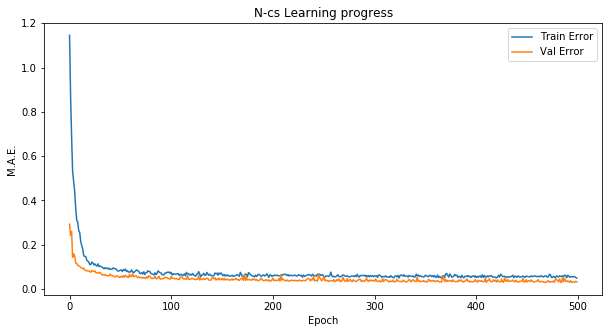

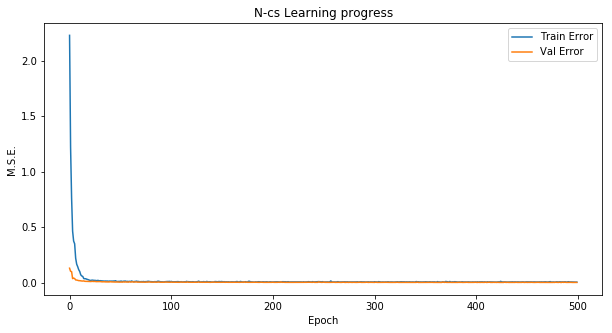

            0
mse  0.002087
mae  0.032083


W0223 19:33:55.967594 21028 nn_ops.py:4283] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

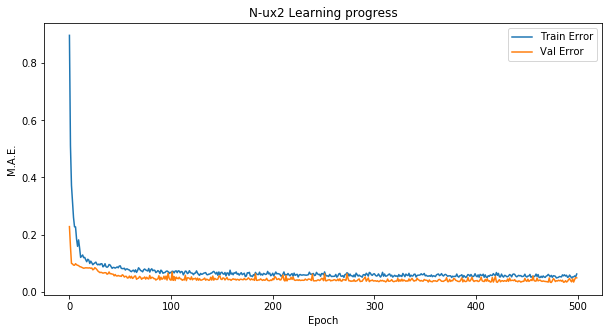

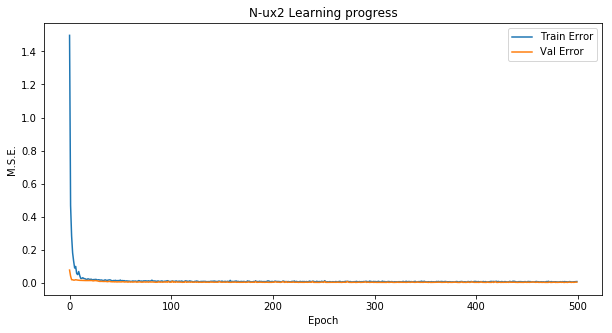

            0
mse  0.004006
mae  0.048592


W0223 19:36:20.396848 21028 nn_ops.py:4283] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

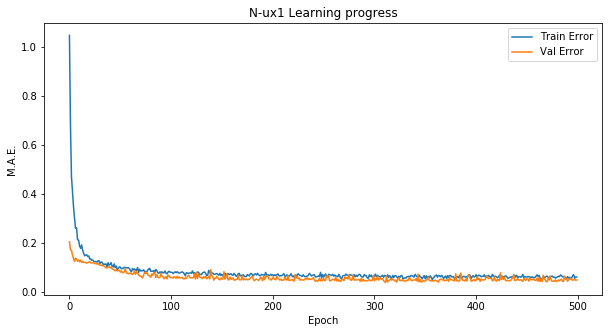

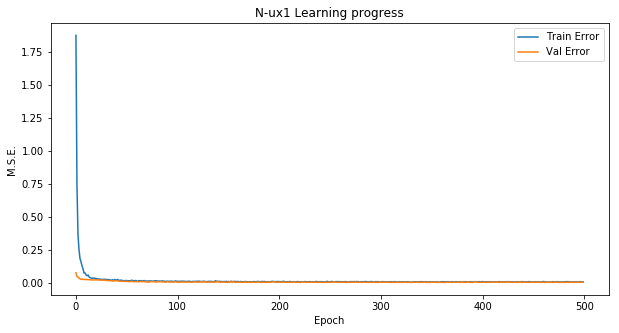

            0
mse  0.004263
mae  0.049504


W0223 19:38:21.997634 21028 nn_ops.py:4283] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

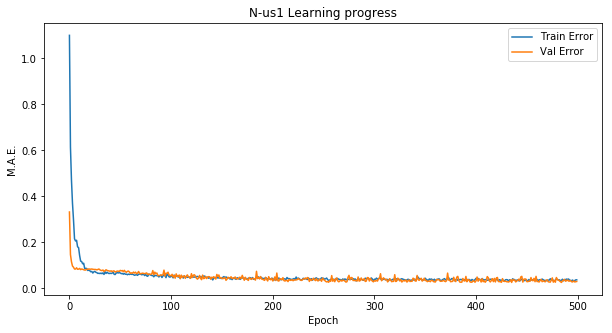

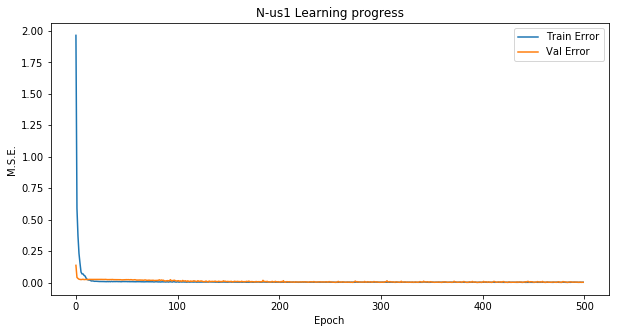

            0
mse  0.002982
mae  0.030392


W0223 19:40:24.430733 21028 nn_ops.py:4283] Large dropout rate: 0.8 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.



....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

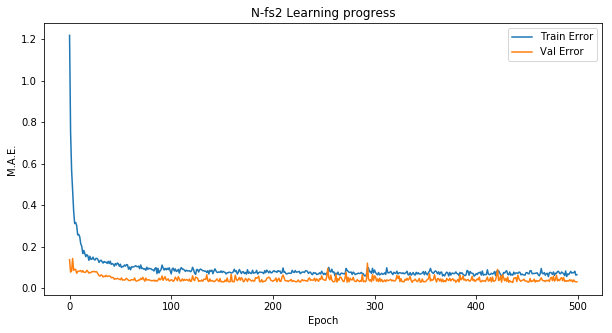

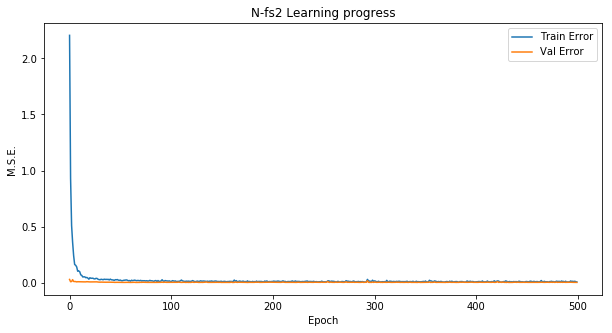

            0
mse  0.003748
mae  0.030717

....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

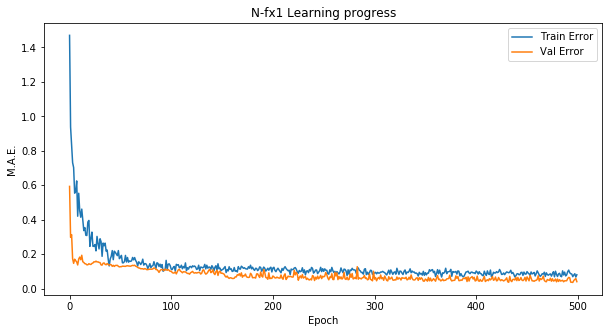

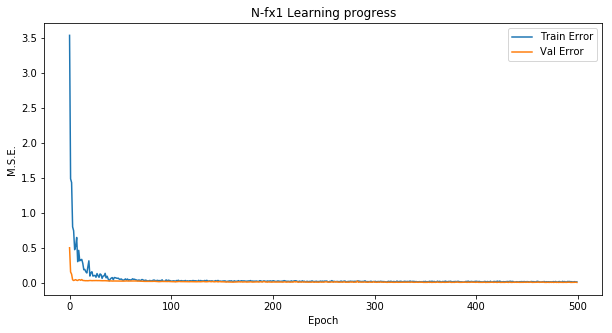

            0
mse  0.003186
mae  0.041003

....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

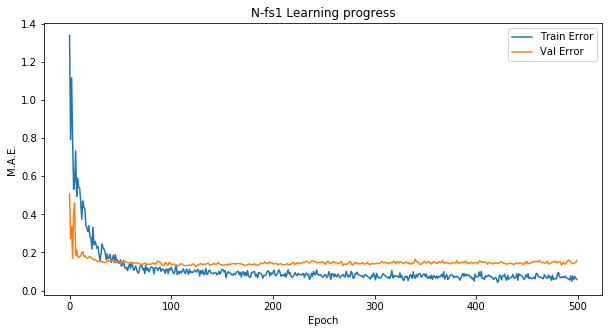

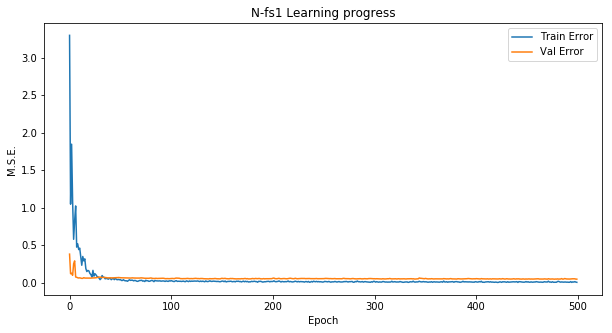

            0
mse  0.047272
mae  0.156314

....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

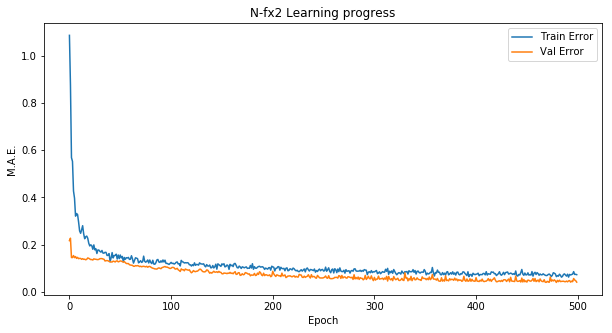

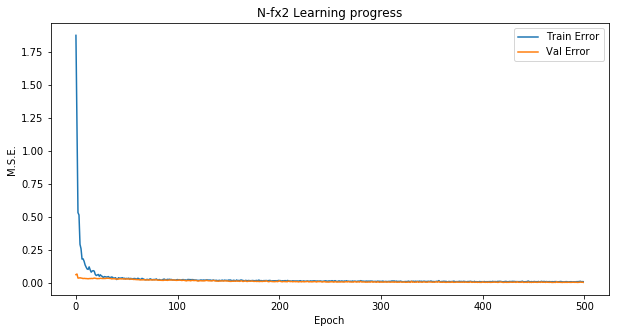

            0
mse  0.003216
mae  0.040557

....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

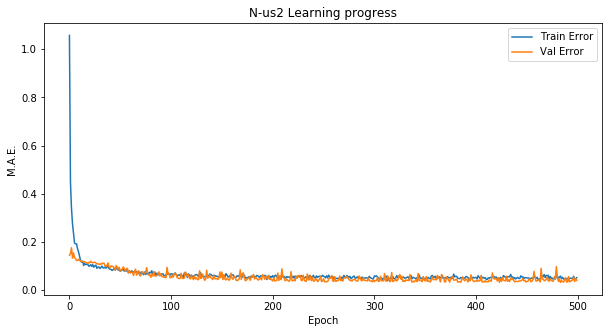

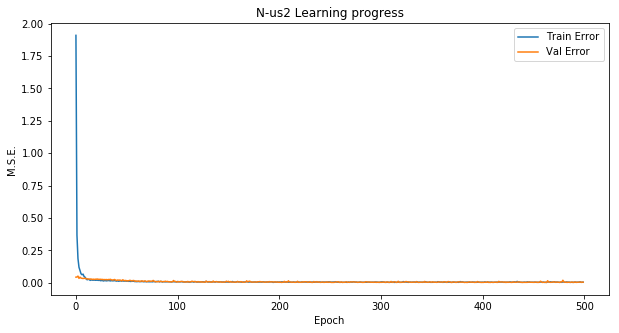

            0
mse  0.004661
mae  0.040228


In [9]:
N = {}

for i, model in enumerate(models):
    name = model['name']
    feed = full_feed
    node_rates = model['node_rates']

    X_data = model['X'].copy()

    for feed_name in feed:
        rf_predictions = rf[feed_name].predict(X_data)
        rf_predictions = pd.DataFrame(rf_predictions, columns=[feed_name])
        X_data = pd.concat([X_data, rf_predictions], axis=1)
        
    #X_data = X_data[y_cols]
    y_data = model['y']

    N[name] = keras.Sequential([
            layers.Dense(node_rates[0], activation=tf.nn.elu, kernel_initializer=tf.keras.initializers.he_uniform(),
                         input_shape=[len(X_data.columns)]),
            layers.Dropout(rate=0.8),
            layers.Dense(node_rates[1], activation=tf.nn.elu, kernel_initializer=tf.keras.initializers.he_uniform()),
            layers.Dropout(rate=0.5),
            layers.Dense(len(y_data.columns))
    ])
    
    N[name].compile(loss=model['loss'], optimizer=optimizer, metrics=['mean_squared_error','mean_absolute_error'])

    history = N[name].fit(X_data, y_data, epochs=EPOCHS, validation_split=0.25, verbose=0, shuffle=True, batch_size=model['batch_size'], callbacks=[PrintDot(), 
                                                                                                                                                   ])

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    hist.to_excel(f"FDNN Models/training/N-{name}.xlsx")
    plot_history(history, f'N-{name}')

    mse, mae = pd.read_excel(f'FDNN Models/training/N-{name}.xlsx')[
        ['val_mean_squared_error', 'val_mean_absolute_error']].iloc[-1].values
    results = [mse, mae]
    val_loss_list = pd.DataFrame(results, index=['mse', 'mae'])
    
    print(val_loss_list)

    N[name].save(f'FDNN Models/N-{name}.h5')